In [1]:
%matplotlib inline

In [2]:
!pip install ipython
!pip install -q livelossplot==0.3.3
!pip install -q ipython-autotime
%load_ext autotime

time: 446 µs (started: 2023-02-12 10:20:14 +00:00)


In [3]:
from __future__ import print_function, division
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
import torch.backends.cudnn as cudnn
import numpy as np
import torchvision
from torchvision import datasets, models, transforms
import matplotlib.pyplot as plt
import time
import os
import copy
import pandas as pd
import numpy as np
import csv
import os
import tarfile
from urllib.parse import urlparse
from urllib.request import urlretrieve
import numpy as np
import torch
from torch.utils.data import Dataset
from PIL import Image
from tqdm import tqdm
from torch.utils.data import DataLoader
from torchvision import transforms
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import f1_score
from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split
cudnn.benchmark = True
plt.ion()   # interactive mode

time: 3.98 s (started: 2023-02-12 10:20:14 +00:00)


In [4]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

cuda:0
time: 108 ms (started: 2023-02-12 10:20:18 +00:00)


In [5]:
%%bash
pwd
wget https://isic-challenge-data.s3.amazonaws.com/2019/ISIC_2019_Training_Input.zip
unzip "ISIC_2019_Training_Input.zip"
wget https://isic-challenge-data.s3.amazonaws.com/2019/ISIC_2019_Training_Metadata.csv
wget https://isic-challenge-data.s3.amazonaws.com/2019/ISIC_2019_Training_GroundTruth.csv

/kaggle/working
Archive:  ISIC_2019_Training_Input.zip
   creating: ISIC_2019_Training_Input/
  inflating: ISIC_2019_Training_Input/ATTRIBUTION.txt  
  inflating: ISIC_2019_Training_Input/ISIC_0000000.jpg  
  inflating: ISIC_2019_Training_Input/ISIC_0000001.jpg  
  inflating: ISIC_2019_Training_Input/ISIC_0000002.jpg  
  inflating: ISIC_2019_Training_Input/ISIC_0000003.jpg  
  inflating: ISIC_2019_Training_Input/ISIC_0000004.jpg  
  inflating: ISIC_2019_Training_Input/ISIC_0000006.jpg  
  inflating: ISIC_2019_Training_Input/ISIC_0000007.jpg  
  inflating: ISIC_2019_Training_Input/ISIC_0000008.jpg  
  inflating: ISIC_2019_Training_Input/ISIC_0000009.jpg  
  inflating: ISIC_2019_Training_Input/ISIC_0000010.jpg  
  inflating: ISIC_2019_Training_Input/ISIC_0000011.jpg  
  inflating: ISIC_2019_Training_Input/ISIC_0000012.jpg  
  inflating: ISIC_2019_Training_Input/ISIC_0000013.jpg  
  inflating: ISIC_2019_Training_Input/ISIC_0000014.jpg  
  inflating: ISIC_2019_Training_Input/ISIC_0000015.j

--2023-02-12 10:20:18--  https://isic-challenge-data.s3.amazonaws.com/2019/ISIC_2019_Training_Input.zip
Resolving isic-challenge-data.s3.amazonaws.com (isic-challenge-data.s3.amazonaws.com)... 3.5.19.21, 52.216.232.11, 52.216.61.89, ...
Connecting to isic-challenge-data.s3.amazonaws.com (isic-challenge-data.s3.amazonaws.com)|3.5.19.21|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 9771618190 (9.1G) [application/zip]
Saving to: ‘ISIC_2019_Training_Input.zip’

     0K .......... .......... .......... .......... ..........  0%  931K 2h50m
    50K .......... .......... .......... .......... ..........  0% 1.81M 2h8m
   100K .......... .......... .......... .......... ..........  0%  931K 2h22m
   150K .......... .......... .......... .......... ..........  0%  936K 2h29m
   200K .......... .......... .......... .......... ..........  0% 1.81M 2h16m
   250K .......... .......... .......... .......... ..........  0% 1.81M 2h8m
   300K .......... .......... ........

time: 3min 56s (started: 2023-02-12 10:20:18 +00:00)


In [6]:
os.remove("/kaggle/working/ISIC_2019_Training_Input.zip")

time: 628 ms (started: 2023-02-12 10:24:15 +00:00)


In [7]:
#helper function
def get_label(row):
  for c in labels.columns:
    if row[c]==1:
      return c

labels = pd.read_csv('ISIC_2019_Training_GroundTruth.csv')
labels['l']=labels.apply(get_label, axis=1)
X=labels.drop(['l','UNK'], axis=1)
y = labels['l']
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.21, random_state=42,stratify=y)
X_train['image'] = 'ISIC_2019_Training_Input/'+X_train['image']+ '.jpg'
X_test['image'] = 'ISIC_2019_Training_Input/'+X_test['image']+ '.jpg'
X_test.to_csv('validation.csv', index=False)
X_train.to_csv('training.csv', index=False)
train_path = 'training.csv'
class_path = 'validation_class.csv'
eval_path = 'validation.csv'
test_meta = 'ISIC_2019_Test_Metadata.csv'
train_img_path = 'ISIC_2019_Training_Input'

time: 922 ms (started: 2023-02-12 10:24:29 +00:00)


In [8]:
class_names = ['MEL', 'NV', 'BCC', 'AK', 'BKL', 'DF', 'VASC', 'SCC', 'UNK']

def read_object_labels_csv(file,phase, header=True):
    img_t=[]
    if phase == 'Train':
      dir = 'training.csv'
    elif phase == "Valid":
      dir = 'validation.csv'
    with open(dir, "r") as f:
        csvReader = csv.reader(f)
        next(csvReader, None)
        k=0
        for line in csvReader:
            k+=1
            image_name= line[0]
            label = line[1:9]
            label = torch.from_numpy(np.array(label, dtype=np.float64))
            item = (image_name,label)
            img_t.append(item)
    return img_t


class ISIC19(Dataset):
    def __init__(self, root, phase, csv_path,transform=None):
        self.root = os.path.abspath(root)
        self.phase = phase
        self.transform = transform
        self.path_images = self.root
        file_csv = pd.read_csv(csv_path)
        self.classes = class_names
        self.images = read_object_labels_csv(file_csv,phase)
        print('[dataset] classification phase={} number of classes={}  number of images={}'.format(phase, len(self.classes), len(self.images)))

    def __getitem__(self, index):
        filename, target = self.images[index]
        filename = filename
        img = Image.open(filename).convert('RGB')
        if self.transform is not None:
            img = self.transform(img)
        
        data = {'image':img, 'target': target}
        return data

    def __len__(self):
        return len(self.images)

    def get_number_classes(self):
        return len(self.classes)


time: 2.22 ms (started: 2023-02-12 10:24:39 +00:00)


In [9]:
data_transforms = {
    'train': transforms.Compose([
        transforms.Resize((224,224)),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'val': transforms.Compose([
        transforms.Resize((224,224)),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
}
train_dataset = ISIC19(train_img_path, transform=data_transforms['train'], phase='Train',csv_path=train_path)
val_dataset = ISIC19(train_img_path, transform=data_transforms['val'],phase='Valid',csv_path=eval_path)
image_datasets ={'train': train_dataset, 'val': val_dataset}
dataloaders = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=16,shuffle=True, num_workers=2)for x in ['train', 'val']}
dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'val']}

[dataset] classification phase=Train number of classes=9  number of images=20011
[dataset] classification phase=Valid number of classes=9  number of images=5320
time: 307 ms (started: 2023-02-12 10:24:46 +00:00)


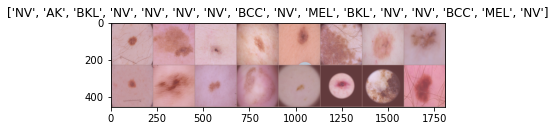

time: 1.87 s (started: 2023-02-12 10:24:53 +00:00)


In [10]:
def imshow(inp, title=None):
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.6678, 0.5298, 0.5245])
    std = np.array([0.1333, 0.1476, 0.1590])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # pause a bit so that plots are updated


data = next(iter(dataloaders['train']))
ps = data['target'].numpy()
l = np.where(ps==1.0)
l = l[1].astype(int)
# Make a grid from batch
out = torchvision.utils.make_grid(data['image'])
imshow(out, title=[class_names[x] for x in l])

In [11]:
model=models.densenet121(pretrained=False)
print(model)
model.classifier=nn.Sequential(nn.Linear(1024, 8), nn.Sigmoid())
model.to(device)

DenseNet(
  (features): Sequential(
    (conv0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (norm0): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu0): ReLU(inplace=True)
    (pool0): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (denseblock1): _DenseBlock(
      (denselayer1): _DenseLayer(
        (norm1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu1): ReLU(inplace=True)
        (conv1): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (norm2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu2): ReLU(inplace=True)
        (conv2): Conv2d(128, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      )
      (denselayer2): _DenseLayer(
        (norm1): BatchNorm2d(96, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu

NameError: name 'checkpoint' is not defined

time: 316 ms (started: 2023-02-12 10:25:03 +00:00)


In [12]:
def validate():
    model.eval()
    
    pred_lst=[]
    gt_lst=[]
    for i, sample in enumerate(dataloaders['val']):    
        images=sample['image']
        labels=sample['target']
        del sample
        images = images.to(device)
        #labels = labels.to(device)
        labels=labels.numpy()
        outputs=model(images)
        outputs=outputs.detach()#.cpu().numpy()
        outputs=outputs.cpu()
        outputs=outputs.numpy()
        pred_lst.append(outputs)
        gt_lst.append(labels)
        del labels, outputs, images
             
    pred_lst=np.concatenate(pred_lst, axis=0)
    gt_lst=np.concatenate(gt_lst, axis=0)
        
    auc_lst=[]
    acc_lst=[]
    for k in range(0,8):
        tmp_gt=gt_lst[:, k]
        tmp_pred=pred_lst[:,k]
        tmp_acc=accuracy_score(tmp_gt, tmp_pred.round())
        acc_lst.append(tmp_acc)
        tmp_auc=roc_auc_score(tmp_gt, tmp_pred)
        auc_lst.append(tmp_auc)
            
    auc_lst=np.array(auc_lst)
    acc_lst=np.array(acc_lst)
    print('\n')
    print(auc_lst)
    print('\n')
    print(acc_lst)
    auc=np.mean(auc_lst)
    acc = np.mean(acc_lst)
    print(auc)
    print(acc)
    f1s=0.0
    model.train()
    return auc,acc,f1s

time: 2.43 ms (started: 2023-02-12 10:25:13 +00:00)


In [13]:
def update_lr(optimizer,lr):
    for param in optimizer.param_groups:
        param["lr"]=lr
    
    return optimizer

time: 594 µs (started: 2023-02-12 10:25:19 +00:00)


In [20]:
model = model.to("cuda")


time: 46.3 ms (started: 2023-02-12 10:48:01 +00:00)


In [21]:
validate()



[0.49853366 0.49139032 0.48256439 0.56483901 0.42327224 0.55524858
 0.45877142 0.58734828]


[0.82011278 0.50827068 0.8325188  0.96578947 0.10357143 0.58233083
 0.99003759 0.03984962]
0.5077459870347799
0.6053101503759399


(0.5077459870347799, 0.6053101503759399, 0.0)

time: 1min 58s (started: 2023-02-12 10:48:03 +00:00)


In [22]:
def train_end_to_end(mx_lr):

    criterion= nn.BCELoss()
    
    optimizer = torch.optim.Adam(model.parameters(), lr=mx_lr, betas=(0.9, 0.999), eps=1e-08, weight_decay=1e-5)
    
    total_batches=len(dataloaders['train'])
    cycle_length= len(dataloaders['train'])*2
    scheduler=torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=cycle_length, eta_min=0, last_epoch=-1)
    model.train()
    running_loss=0
    count=0
    max_epochs=2
    for epoch in range(0, max_epochs):
        
        for i, sample in enumerate(dataloaders['train']):
    
            images=sample['image'].float()
            labels=sample['target'].float()
            del sample
            images = images.to(device)
            labels = labels.to(device)
            outputs=model(images)
            loss = criterion(outputs, labels)
            running_loss=running_loss+loss.item()
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            scheduler.step()
            if (i+1) % 25 == 0: # displays after every 20 batches
                    print ("Epoch [{}/{}], Batch [{}/{}] Classification Loss: {:.4f}"
                       .format(epoch+1, max_epochs, i+1, total_batches, 
                        running_loss/(i+1) ), end ="\r")
                    
            count=count+1
            if count>=cycle_length:
                count=0
                auc,acc,f1=validate()
                # Save the weight
                auc=np.round(auc,4)
                nm='DENSENET121_wt_epoch_'+str(epoch)+'_batch_'+str(i)+'_auc_'+str(auc)+'.pt'
                torch.save({
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict()
                }, nm)
                del nm
                running_loss=0
                optimizer=update_lr(optimizer, mx_lr)
                scheduler=torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=cycle_length, eta_min=0, last_epoch=-1)
    
    return model

time: 3.66 ms (started: 2023-02-12 10:50:18 +00:00)


In [ ]:
model=train_end_to_end( mx_lr=10**(-4))

In [ ]:
pip install grad-cam

In [ ]:
from pytorch_grad_cam import GradCAM, HiResCAM, ScoreCAM, GradCAMPlusPlus, AblationCAM, XGradCAM, EigenCAM, FullGrad
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image

In [ ]:
from PIL import Image
from matplotlib.pyplot import imshow
from torchvision import models, transforms
from torchvision.utils import save_image

In [ ]:
image = Image.open('/kaggle/input/isic-2019/ISIC_2019_Training_Input/ISIC_2019_Training_Input/ISIC_0000075.jpg').convert('RGB')
imshow(image)
image = image.resize((224, 224), Image.ANTIALIAS)

print(image.size)
image = np.array(image)
image2 = np.float32(image) / 255

In [ ]:
image1 = Image.open('/kaggle/input/isic-2019/ISIC_2019_Training_Input/ISIC_2019_Training_Input/ISIC_0000075.jpg').convert('RGB')
preprocess = data_transforms['val']
tensor = preprocess(image1)
tensor2 = tensor.unsqueeze(0)
tensor2 = tensor2.float()

In [ ]:
target_layer = [model.features.denseblock4.denselayer16.conv2]
tensor2 = tensor2.to(device)
plt.figure(figsize=(40,80))
for x in range(0,8):
    cam = GradCAMPlusPlus(model=model, target_layers=target_layer)
    targets1 = [ClassifierOutputTarget(category=x)]
    grayscale_cam = cam(input_tensor=tensor2,targets=targets1)
    grayscale_cam = grayscale_cam[0, :]
    visualization = show_cam_on_image(image2, grayscale_cam, use_rgb=True)
    cam = np.uint8(255*grayscale_cam[0, :])
    cam = cv2.merge([cam, cam, cam])
    images = np.hstack((np.uint8(255*image), visualization))
    if(x==0):
        imaget = images
    else:
        imaget = np.vstack((imaget,images))
    
imshow(Image.fromarray(imaget))

In [ ]:
target_layer = [model.features.denseblock4.denselayer16.conv2]
tensor2 = tensor2.to(device)
plt.figure(figsize=(40,80))
for x in range(0,8):
    cam = GradCAMPlusPlus(model=model, target_layers=target_layer)
    targets1 = [ClassifierOutputTarget(category=x)]
    grayscale_cam = cam(input_tensor=tensor2,targets=targets1)
    grayscale_cam = grayscale_cam[0, :]
    visualization = show_cam_on_image(image2, grayscale_cam, use_rgb=True)
    cam = np.uint8(255*grayscale_cam[0, :])
    cam = cv2.merge([cam, cam, cam])
    images = np.hstack((np.uint8(255*image), visualization))
    if(x==0):
        imaget = images
    else:
        imaget = np.vstack((imaget,images))
    
imshow(Image.fromarray(imaget))

In [ ]:
target_layer = [model.features.denseblock4.denselayer16.conv2]
tensor2 = tensor2.to(device)
plt.figure(figsize=(40,80))
for x in range(0,8):
    cam = GradCAMPlusPlus(model=model, target_layers=target_layer)
    targets1 = [ClassifierOutputTarget(category=x)]
    grayscale_cam = cam(input_tensor=tensor2,targets=targets1)
    grayscale_cam = grayscale_cam[0, :]
    visualization = show_cam_on_image(image2, grayscale_cam, use_rgb=True)
    cam = np.uint8(255*grayscale_cam[0, :])
    cam = cv2.merge([cam, cam, cam])
    images = np.hstack((np.uint8(255*image), visualization))
    if(x==0):
        imaget = images
    else:
        imaget = np.vstack((imaget,images))
    
imshow(Image.fromarray(imaget))